# Final project DL4CV
# CMS4CV - Data handling, loading, and preprocessing Appendix

## Task:
## Historical image Recoloring and Super-Resolution


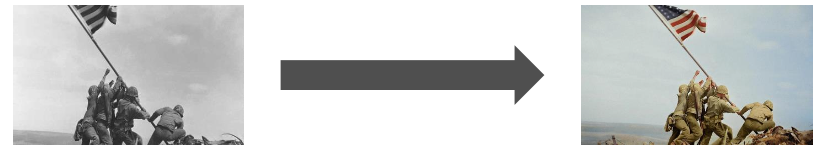

## Data:

1.   https://www.kaggle.com/datasets/hsankesara/flickr-image-dataset/data
2.   https://www.kaggle.com/datasets/rahulrwl/landscape-images/data
3.   https://www.kaggle.com/datasets/medsalimaissi/similarity-dataset (selected images for zero-shot inference: https://www.kaggle.com/datasets/pierluigimancinelli/landscape-historical-images)

## Execution:
1. Written and optimized to run on Kaggle, running on Colab may require dataset download and path adjustments

# Aknowledgements:
We use this space to conduct explorative analyses and exploration. This notebook serves as explanatory appendix to be reference to in the following computational notebooks

# Imports

In [ ]:
%%capture
!pip install  "modin[all]" gdown

In [ ]:
# Set seed for reproducibility
seed = 123
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

#miscellanea - Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import modin.pandas as pd
import random
from PIL import Image
from keras import backend as K
import logging
import sys
from collections import defaultdict
from tqdm import tqdm
import cv2
import shutil

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# ⏳ Load Data

We download images directly from Kaggle, thus avoiding storage and sharing issues.


## TO DELETE: Final df

In [ ]:
# Example usage
image_folder = image_folder
output_folder = "./output_folder"
image_names = b.image_name
flickr_names = flickr_names

In [ ]:
len(image_names)+len(flickr_names)

33601

In [ ]:
b.image_name[0]

'/root/.cache/kagglehub/datasets/hsankesara/flickr-image-dataset/versions/1/flickr30k_images/flickr30k_images/flickr30k_images/1000092795.jpg'

In [ ]:
image_folder

'/root/.cache/kagglehub/datasets/hsankesara/flickr-image-dataset/versions/1/flickr30k_images/flickr30k_images/flickr30k_images/'

In [ ]:
def process_images(image_names, image_folder, flickr_names, output_folder):
    """
    Process images to resize and crop them, saving the results to an output folder to minimize memory usage.

    Args:
    - image_names: List of image file names to resize from `image_folder`.
    - image_folder: Path to the folder containing initial images.
    - flickr_names: List of image file paths to crop and resize.
    - output_folder: Path to save processed images to avoid memory overloading.
    """
    if not os.path.exists(output_folder):
      os.makedirs(output_folder)

      # Resize images in `b.image_name` (First dataset)
      print('Saving first dataset ...')
      for name in tqdm(image_names):
          img_path = name
          filename = img_path.split("/")[-1]
          with Image.open(img_path) as img:
              resized_img = img.resize((512, 512))
              # Save the resized image to the output folder
              resized_img.save(os.path.join(output_folder, f"d1_{filename}.png"))

      processed_count = 0

      # Crop and resize images in `flickr_names` (Second dataset)
      print('Saving second dataset ...')
      for p in tqdm(flickr_names):
          with Image.open(p) as im:
              height, width = im.size[1], im.size[0]
              left = width // 2 - 250
              top = height // 2 - 250
              right = width // 2 + 250
              bottom = height // 2 + 250

              # Crop the image at its center
              cropped_img = im.crop((left, top, right, bottom))
              # Resize to 512x512
              resized_img = cropped_img.resize((512, 512))
              # Save the processed image to the output folder
              resized_img.save(os.path.join(output_folder, f"d2_{processed_count}.png"))
              processed_count += 1
      print(f"Images saved to {output_folder}.")
    else:
      print(f"Images already saved to {output_folder}.")

# Example usage
image_folder = image_folder
output_folder = "./output_folder"
image_names = b.image_name
flickr_names = flickr_names

process_images(image_names, image_folder, flickr_names, output_folder)

Saving first dataset ...


100%|██████████| 31553/31553 [1:20:21<00:00,  6.54it/s]


Saving second dataset ...


100%|██████████| 2048/2048 [06:33<00:00,  5.21it/s]

Images saved to ./output_folder.


In [ ]:
# Free some RAM
del b, image_names, flickr_names

In [ ]:
shutil.make_archive('final_dataset', 'zip', 'output_folder')

'/content/final_dataset.zip'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1) First dataset

### Importing Data from Kaggle

In [ ]:
import kagglehub

path = kagglehub.dataset_download("hsankesara/flickr-image-dataset")

print("Path to dataset files:", path)

100%|██████████| 8.16G/8.16G [04:57<00:00, 29.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/hsankesara/flickr-image-dataset/versions/1


In [ ]:
image_folder = path + "/flickr30k_images/flickr30k_images/flickr30k_images/"

In [ ]:
image_df = pd.read_csv(path + "/flickr30k_images/flickr30k_images/results.csv", sep="|")

2024-11-23 08:58:58,989	INFO worker.py:1819 -- Started a local Ray instance.


In [ ]:
image_df

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .
...,...,...,...
158910,998845445.jpg,0,A man in shorts and a Hawaiian shirt leans ov...
158911,998845445.jpg,1,"A young man hanging over the side of a boat ,..."
158912,998845445.jpg,2,A man is leaning off of the side of a blue an...
158913,998845445.jpg,3,"A man riding a small boat in a harbor , with ..."


The dataset contains also 5 labels for each image, as it was supposed to train a image captioning model. Hence, we remove redundant rows, keeping one for each image-label pair. In the end, labels are not going to be used.

In [ ]:
# column re-naming
image_df['comment_number'] = image_df[' comment_number']
image_df['comment'] = image_df[' comment']

In [ ]:
# row filtering to keep unique image names
image_names = image_df.image_name.unique()

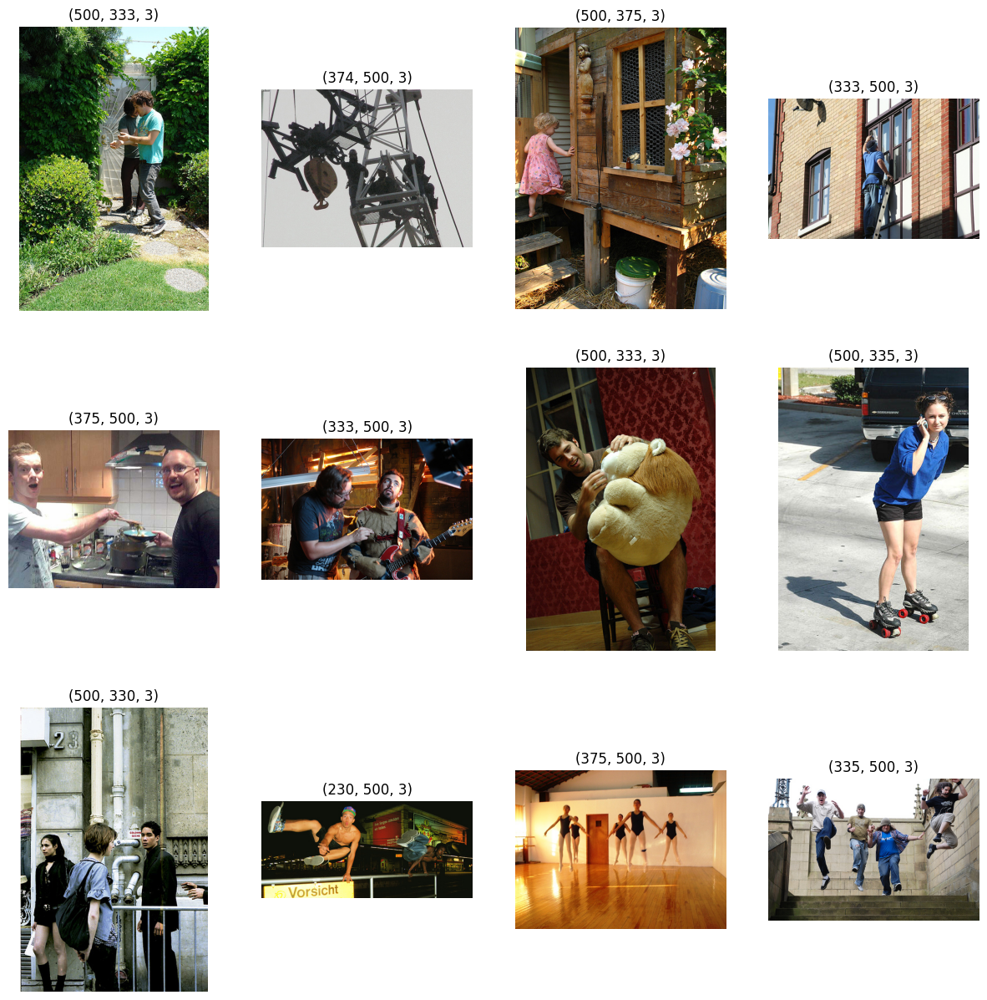

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(0, 12):
  plt.subplot(3, 4, i+1)
  image_file = image_folder + image_names[i]

  # show image_file
  image = plt.imread(image_file)
  plt.imshow(image)
  plt.title(image.shape)
  plt.axis('off')

plt.show()

We provide some summary statistics over images' dimensions, in order to find a strategy to equate all their sizes into a square

In [ ]:
data = defaultdict(list)
for photo_name in tqdm(image_names):
    img = np.array(Image.open(image_folder + photo_name))
    data['height'].append(img.shape[0])
    data['width'].append(img.shape[1])
    data['image_name'].append(image_folder + photo_name)


100%|██████████| 31783/31783 [02:46<00:00, 190.75it/s]


In [ ]:
a = pd.DataFrame(data)
a['ratio'] = a['height'] / a['width']
a.head()

,height,width,image_name,ratio
0,500,333,/root/.cache/kagglehub/datasets/hsankesara/fli...,1.501502
1,374,500,/root/.cache/kagglehub/datasets/hsankesara/fli...,0.748000
2,500,375,/root/.cache/kagglehub/datasets/hsankesara/fli...,1.333333
3,333,500,/root/.cache/kagglehub/datasets/hsankesara/fli...,0.666000
4,375,500,/root/.cache/kagglehub/datasets/hsankesara/fli...,0.750000


In [ ]:
a.describe()

,height,width,ratio
count,31783.000000,31783.000000,31783.000000
mean,395.131485,459.607148,0.907162
std,74.361142,67.482044,0.333713
min,112.000000,164.000000,0.224000
25%,333.000000,395.000000,0.666000
50%,375.000000,500.000000,0.750000
75%,500.000000,500.000000,1.256281
max,500.000000,500.000000,3.048780


We pick two arbitrary values that do not cause excessive stretching or compression during resizing

In [ ]:
b = a[(a.ratio >=  0.5) & ( a.ratio <=  2 )]
b.width.value_counts()

width
500    22562
333     2570
375     2312
332      507
334      483
       ...  
254        1
252        1
226        1
246        1
180        1
Name: count, Length: 253, dtype: int64

In [ ]:
b.describe()

,height,width,ratio
count,31553.000000,31553.000000,31553.000000
mean,396.123728,459.632301,0.908512
std,73.147696,67.162394,0.329304
min,191.000000,180.000000,0.500000
25%,333.000000,393.000000,0.666000
50%,375.000000,500.000000,0.750000
75%,500.000000,500.000000,1.262626
max,500.000000,500.000000,2.000000


Given the variety of sizes and combination, let alone the presence of people and interesting objects, we decide not to crop these images. Rather, we just resize them to be 512x512, also considering the dimensional filtering provided above

In [ ]:
np.argmin(b.width)

18152

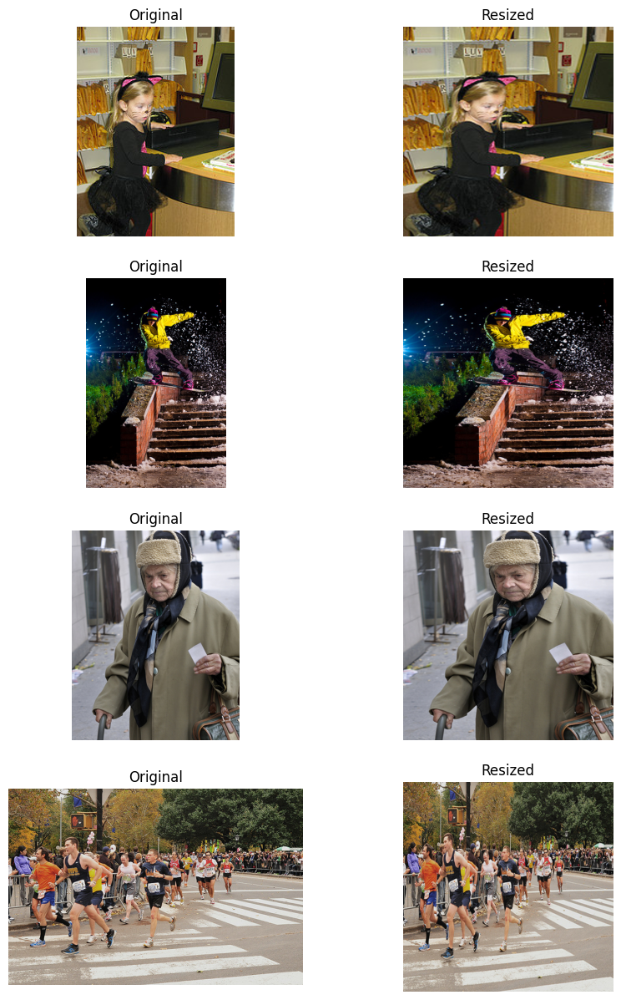

In [ ]:
fig, ax = plt.subplots(4, 2, figsize=(10, 15))

for i, id in enumerate(b.index[18152:18156]):
  ax[i, 0].imshow(Image.open(image_names[id]))
  ax[i, 0].set_title('Original')
  ax[i, 0].axis('off')

  ax[i, 1].imshow(Image.open(image_names[id]).resize((512, 512)))
  ax[i, 1].set_title('Resized')
  ax[i, 1].axis('off')

plt.show()


As the visualization above shows, neither stretches, nor compressions are so strong to hamper the image contex.

### Image transformations: gray-scaling, downsampling, graining, and blurring
We applied a variety of transformations, including gray-scaling, downsampling, adding grain, and blurring, to explore their effects on image characteristics and evaluate potential enhancements.

In [ ]:
image_names = b.image_name.copy()

del b

In [ ]:
# Function to add film grain
def add_grain(image, intensity=0.5):
    noise = np.random.normal(0, intensity, image.shape).astype('uint8')
    grainy_image = cv2.add(image, noise)
    return grainy_image

# Function to apply blur filter
def apply_blur(image, kernel_size=(5, 5)):
    return cv2.GaussianBlur(image, kernel_size, 0)

# Function to convert an image to grayscale using the luminance formula
def convert_to_grayscale(image):
    grayscale_image = (
        0.2989 * image[:, :, 0] +  # Red channel
        0.5870 * image[:, :, 1] +  # Green channel
        0.1140 * image[:, :, 2]    # Blue channel
    )
    return grayscale_image.astype('uint8')

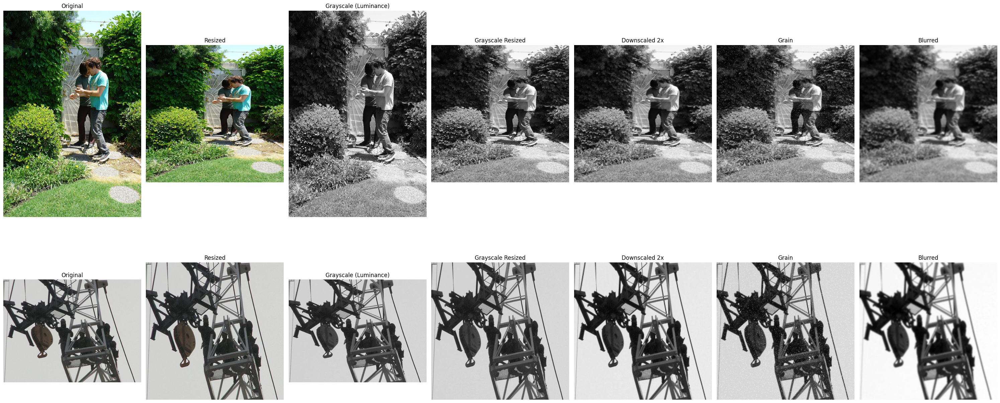

In [ ]:
# Method using OpenCV: resizing, grayscaling, downscaling, ...
fig, ax = plt.subplots(2, 7, figsize=(30, 15))

for i, image_name in enumerate(image_names[:2]):
    # Load the image
    im = Image.open(image_name)
    im_np = np.array(im)

    # Original Image
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('Original')
    ax[i, 0].axis('off')

    # Resized Image (512x512)
    res_im = im.resize((512, 512))
    ax[i, 1].imshow(res_im)
    ax[i, 1].set_title('Resized')
    ax[i, 1].axis('off')

    # Grayscale Image using the custom function
    grayscale_image = convert_to_grayscale(im_np)
    ax[i, 2].imshow(grayscale_image, cmap='gray')
    ax[i, 2].set_title('Grayscale (Luminance)')
    ax[i, 2].axis('off')

    # Grayscale Resized Image (512x512)
    grey_resized = cv2.resize(grayscale_image, (512, 512))
    ax[i, 3].imshow(grey_resized, cmap='gray')
    ax[i, 3].set_title('Grayscale Resized')
    ax[i, 3].axis('off')

    # Downscaled Image (2x)
    height, width = grey_resized.shape
    grey_downscaled = cv2.resize(grey_resized, (width // 2, height // 2), interpolation=cv2.INTER_AREA)
    ax[i, 4].imshow(grey_downscaled, cmap='gray')
    ax[i, 4].set_title('Downscaled 2x')
    ax[i, 4].axis('off')

    # Grainy Image (applied to resized grayscale and then downscaled)
    grainy_image_resized = add_grain(grey_resized)
    grainy_image_downscaled = cv2.resize(grainy_image_resized, (width // 2, height // 2), interpolation=cv2.INTER_AREA)
    ax[i, 5].imshow(grainy_image_downscaled, cmap='gray')
    ax[i, 5].set_title('Grain')
    ax[i, 5].axis('off')

    # Blurred Image
    blurred_image = apply_blur(grey_downscaled)
    ax[i, 6].imshow(blurred_image, cmap='gray')
    ax[i, 6].set_title('Blurred')
    ax[i, 6].axis('off')

plt.tight_layout()
plt.show()

### Constructing an Exposure Rate Score
To understand the overall distribution of image exposure, we constructed an Exposure Rate Score that evaluates image exposure by balancing overexposed and underexposed areas. It is calculated as the percentage of overexposed pixels (intensity ≥ 250) minus the percentage of underexposed pixels (intensity ≤ 5). A positive score indicates overexposure, a negative score suggests underexposure, and a score near zero reflects well-balanced exposure.

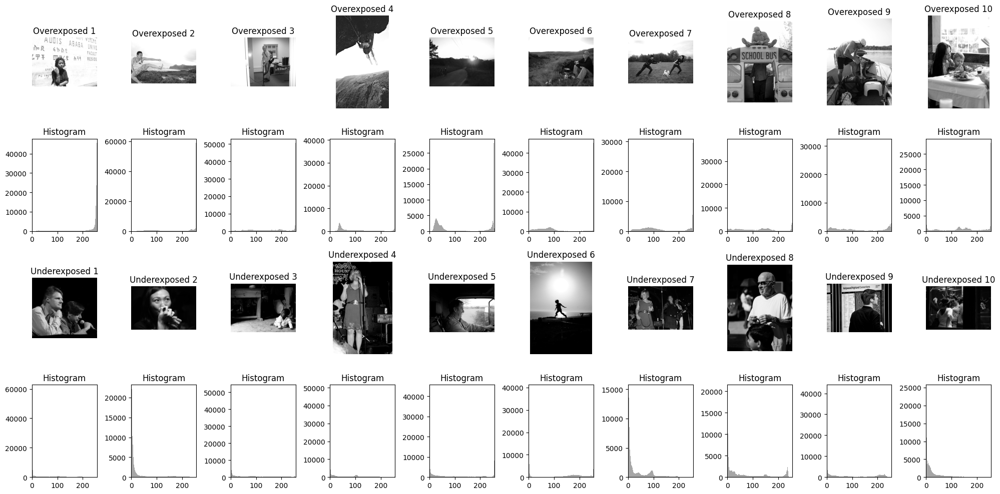

In [ ]:
# Analyzing top overexposed and top underexposed images
exposure_stats = []

for image_name in image_names[1000:2000]:
    image = cv2.imread( image_name, cv2.IMREAD_GRAYSCALE)
    pixels = image.flatten()
    overexposed_score = np.sum(pixels >= 250) / len(pixels) * 100  # % of pixels close to 255
    underexposed_score = np.sum(pixels <= 5) / len(pixels) * 100   # % of pixels close to 0
    exposure_stats.append({
        'Image': image_name,
        'Overexposed Score (%)': overexposed_score,
        'Underexposed Score (%)': underexposed_score
    })

exposure_stats_df = pd.DataFrame(exposure_stats)
top_overexposed = exposure_stats_df.sort_values(by='Overexposed Score (%)', ascending=False).head(10)
top_underexposed = exposure_stats_df.sort_values(by='Underexposed Score (%)', ascending=False).head(10)

fig, axes = plt.subplots(4, 10, figsize=(20, 10))

# Display overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
        pixels = image.flatten()

        # Image plot
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1}")
        axes[0, idx].axis('off')

        # Histogram plot
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram")
        axes[1, idx].set_xlim(0, 255)

# Display underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
        pixels = image.flatten()

        # Image plot
        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1}")
        axes[2, idx].axis('off')

        # Histogram plot
        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

To understand the overall distribution of image exposure in your dataset, we create a histogram or a kernel density estimate (KDE) plot that visualizes the overexposed and underexposed scores across all images.

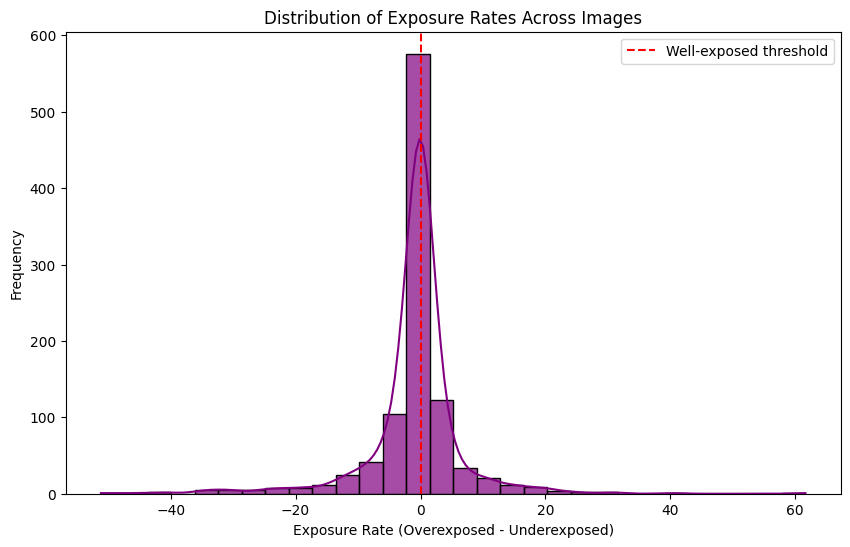

In [ ]:
exposure_metrics = []
# Compute exposure scores for each image
for image_name in image_names[1000:2000]:
    image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    pixels = image.flatten()
    overexposed_score = np.sum(pixels >= 250) / len(pixels) * 100
    underexposed_score = np.sum(pixels <= 5) / len(pixels) * 100

    # Compute overall exposure rate
    exposure_rate = overexposed_score - underexposed_score
    exposure_metrics.append({
        'Image': image_name,
        'Exposure Rate': exposure_rate
    })

exposure_metrics_df = pd.DataFrame(exposure_metrics)
plt.figure(figsize=(10, 6))
sns.histplot(exposure_metrics_df['Exposure Rate'], kde=True, bins=30, color='purple', alpha=0.7)
plt.title('Distribution of Exposure Rates Across Images')
plt.xlabel('Exposure Rate (Overexposed - Underexposed)')
plt.ylabel('Frequency')
plt.axvline(0, color='red', linestyle='--', label='Well-exposed threshold')
plt.legend()
plt.show()

In [ ]:
mean_exposure_rate = exposure_metrics_df['Exposure Rate'].mean()
std_exposure_rate = exposure_metrics_df['Exposure Rate'].std()

# Calculate 2 standard deviations from the mean
threshold_high = mean_exposure_rate + 2 * std_exposure_rate
threshold_low = mean_exposure_rate - 2 * std_exposure_rate

print(f"Exposure Rate 2 standard deviations above the mean: {threshold_high:.2f}")
print(f"Exposure Rate 2 standard deviations below the mean: {threshold_low:.2f}")

Exposure Rate 2 standard deviations above the mean: 14.63
Exposure Rate 2 standard deviations below the mean: -16.31


###  Histogram Equalization
For images with exposure rates outside the thresholds defined as two standard deviations from the mean, we applied histogram equalization as a global enhancement technique. While it effectively improves the visibility of details in many cases, it may over-amplify contrast in areas with uniform intensity, leading to a loss of finer details in those regions.

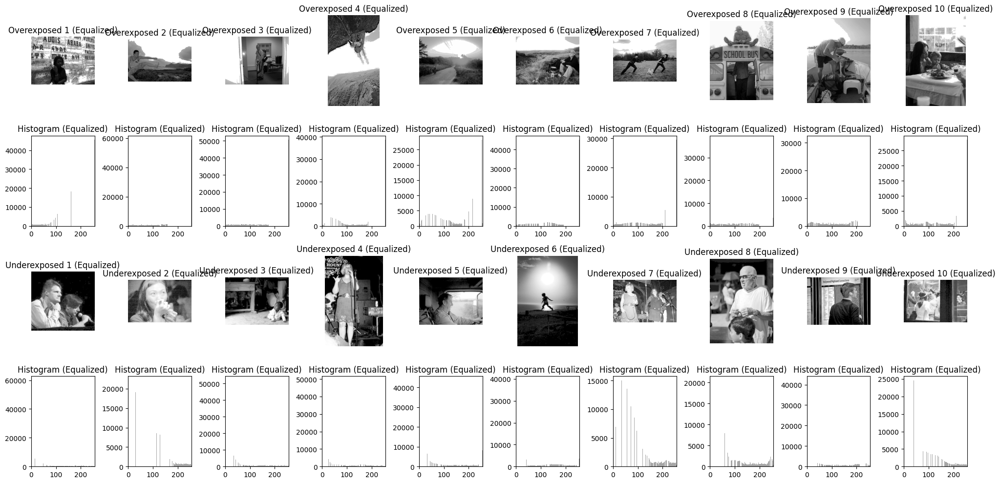

In [ ]:
equalized_images = {}

for idx, row in exposure_metrics_df.iterrows():
    if row['Exposure Rate'] > threshold_high or row['Exposure Rate'] < threshold_low:
        image_path = row['Image']
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            equalized_image = cv2.equalizeHist(image)
            equalized_images[row['Image']] = equalized_image

fig, axes = plt.subplots(4, 10, figsize=(20, 10))

# Display updated overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after histogram equalization)
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1} (Equalized)")
        axes[0, idx].axis('off')

        # Histogram plot (after histogram equalization)
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram (Equalized)")
        axes[1, idx].set_xlim(0, 255)

# Display updated underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after histogram equalization)
        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1} (Equalized)")
        axes[2, idx].axis('off')

        # Histogram plot (after histogram equalization)
        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram (Equalized)")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

### CLAHE (Contrast Limited Adaptive Histogram Equalization)
In addition to histogram equalization, we applied CLAHE (Contrast Limited Adaptive Histogram Equalization) to the same set of images for comparison. CLAHE operates locally by dividing the image into smaller tiles, applying equalization within each tile, and limiting the amplification of noise through a contrast clipping parameter.

As observed from the histograms of CLAHE-adjusted images, the intensity values are more evenly distributed with fewer sharp peaks, indicating better balance and contrast.

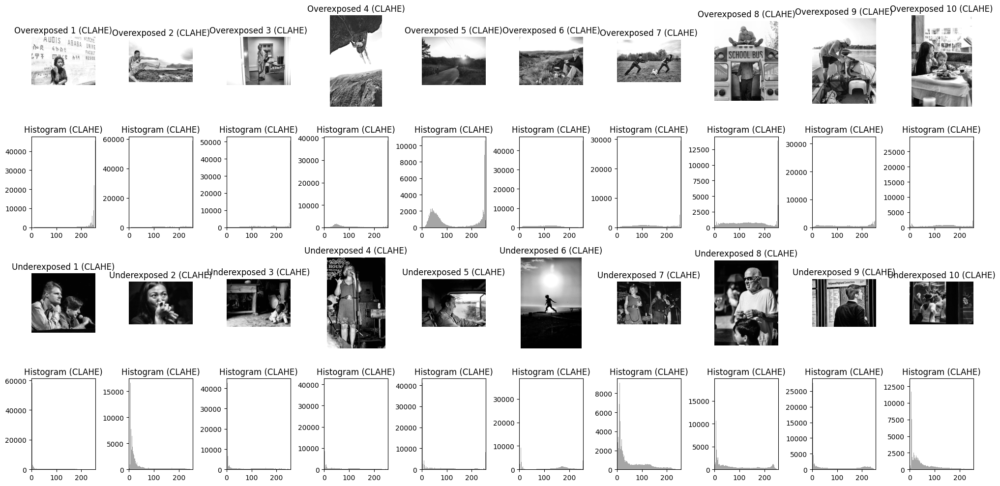

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
equalized_images = {}

for idx, row in exposure_metrics_df.iterrows():
    if row['Exposure Rate'] > threshold_high or row['Exposure Rate'] < threshold_low:
        image_path = row['Image']
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            clahe_image = clahe.apply(image)
            equalized_images[row['Image']] = clahe_image

fig, axes = plt.subplots(4, 10, figsize=(20, 10))

# Display updated overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after CLAHE)
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1} (CLAHE)")
        axes[0, idx].axis('off')

        # Histogram plot (after CLAHE)
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram (CLAHE)")
        axes[1, idx].set_xlim(0, 255)

# Display updated underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1} (CLAHE)")
        axes[2, idx].axis('off')

        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram (CLAHE)")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

### Overwriting images with the chosen method

In [ ]:
# Function to correct images based on the chosen method
def correct_images(image_folder, exposure_metrics_df, threshold_high, threshold_low, method="HE", clipLimit=2.0, tileGridSize=(8, 8)):
    """
    Correct images using Histogram Equalization (HE) or CLAHE and overwrite them.

    Parameters:
    - image_folder (str): Path to the folder containing images.
    - exposure_metrics_df (DataFrame): DataFrame with exposure metrics.
    - threshold_high (float): High threshold for exposure rate.
    - threshold_low (float): Low threshold for exposure rate.
    - method (str): Correction method ("HE" for Histogram Equalization, "CLAHE" for CLAHE).
    - clipLimit (float): CLAHE clip limit (used if method="CLAHE").
    - tileGridSize (tuple): CLAHE tile grid size (used if method="CLAHE").
    """
    if method == "CLAHE":
        clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)

    for idx, row in exposure_metrics_df.iterrows():
        if row['Exposure Rate'] > threshold_high or row['Exposure Rate'] < threshold_low:
            image_path = os.path.join(image_folder, row['Image'])
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if image is not None:
                if method == "HE":
                    corrected_image = cv2.equalizeHist(image)  # Apply Histogram Equalization
                elif method == "CLAHE":
                    corrected_image = clahe.apply(image)  # Apply CLAHE
                else:
                    raise ValueError("Invalid method. Use 'HE' for Histogram Equalization or 'CLAHE'.")

                # Overwrite the original image with the corrected one
                cv2.imwrite(image_path, corrected_image)

# Example Usage
correct_images(
    image_folder=image_folder,
    exposure_metrics_df=exposure_metrics_df,
    threshold_high=threshold_high,
    threshold_low=threshold_low,
    method="CLAHE",  # Change to "HE" for Histogram Equalization
    clipLimit=2.0,
    tileGridSize=(8, 8)
)

In [ ]:
del image_df, a, data

# 2) Dataset: Landscapes Images

### Importing Data from Kaggle

In [ ]:
import kagglehub
path2 = kagglehub.dataset_download("rahulrwl/landscape-images")
print("Path to dataset files:", path2)

Path to dataset files: /root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1


In [ ]:
folder_path = path2 + '/images'
folder_path

'/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images'

In [ ]:
flickr_names = []

for root, dirs, files in os.walk(folder_path):
  for f in files:
    flickr_names.append(os.path.join(folder_path, f))

flickr_names = np.array(flickr_names)

In [ ]:
c = defaultdict(list)
for p in tqdm(flickr_names):
  im = np.array(Image.open(p))
  c['width'].append(im.shape[0])
  c['height'].append(im.shape[1])
  c['ratio'].append(im.shape[1] / im.shape[0])
  c['image_name'].append(p)

c = pd.DataFrame(c)
c.describe()

array(['/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114031104_18.jpg',
       '/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114044524_20.jpg',
       '/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114010613_6.jpg',
       ...,
       '/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114010341_21.jpg',
       '/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114010229_13.jpg',
       '/root/.cache/kagglehub/datasets/rahulrwl/landscape-images/versions/1/images/image_20231114031314_2.jpg'],
      dtype='<U103')

In [ ]:
d = c[(c.ratio >=  0.5) & ( c.ratio <=  2 )]
flickr_names = d.image_name.to_numpy()

del c, d

For the same reasoning detailed above, we filter to keep the images for which resizing does not hamper the depicted subjects and we just resize, avoiding any crop.

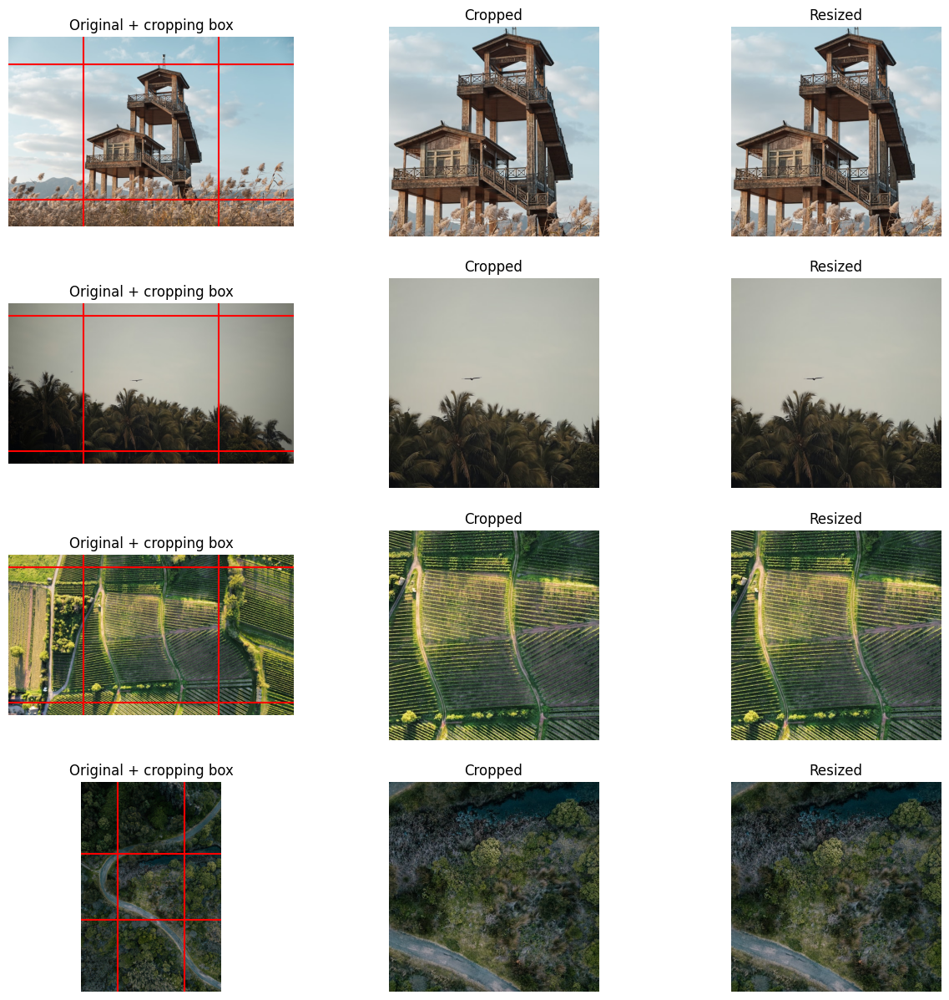

In [ ]:
fig, axs = plt.subplots(4, 2, figsize=(15, 15))

for i, p in enumerate(flickr_names[:4]):
  im = Image.open(p)


  ax = axs[i, 0]
  ax.imshow(im)
  image = plt.imread(p)
  ax.set_title(image.shape)
  ax.set_title('Original + cropping box')
  ax.axis('off')

  # draw a box given the above coordinates
  ax.axhline(y=top, color='r', linestyle='-')
  ax.axhline(y=bottom, color='r', linestyle='-')
  ax.axvline(x=left, color='r', linestyle='-')
  ax.axvline(x=right, color='r', linestyle='-')

  ax = axs[i, 1]
  ax.imshow(im.resize((512, 512)))
  ax.set_title('Cropped')
  ax.axis('off')


plt.show()

### Image transformations: gray-scaling, downsampling, graining, and blurring
We applied a variety of transformations, including gray-scaling, downsampling, adding grain, and blurring, to explore their effects on image characteristics and evaluate potential enhancements.

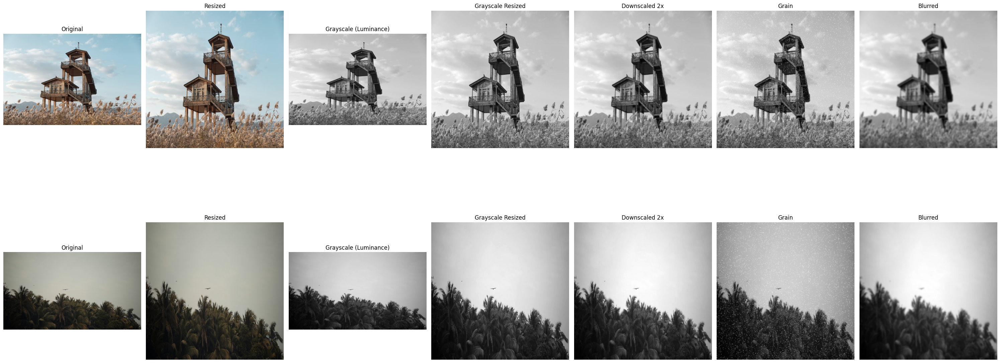

In [ ]:
fig, ax = plt.subplots(2, 7, figsize=(30, 15))

for i, image_name in enumerate(flickr_names[:2]):
    # Load the image
    im = Image.open(image_name)
    im_np = np.array(im)

    # Original Image
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('Original')
    ax[i, 0].axis('off')

    # Resized Image (512x512)
    res_im = im.resize((512, 512))
    ax[i, 1].imshow(res_im)
    ax[i, 1].set_title('Resized')
    ax[i, 1].axis('off')

    # Grayscale Image using the custom function
    grayscale_image = convert_to_grayscale(im_np)
    ax[i, 2].imshow(grayscale_image, cmap='gray')
    ax[i, 2].set_title('Grayscale (Luminance)')
    ax[i, 2].axis('off')

    # Grayscale Resized Image (512x512)
    grey_resized = cv2.resize(grayscale_image, (512, 512))
    ax[i, 3].imshow(grey_resized, cmap='gray')
    ax[i, 3].set_title('Grayscale Resized')
    ax[i, 3].axis('off')

    # Downscaled Image (2x)
    height, width = grey_resized.shape
    grey_downscaled = cv2.resize(grey_resized, (width // 2, height // 2), interpolation=cv2.INTER_AREA)
    ax[i, 4].imshow(grey_downscaled, cmap='gray')
    ax[i, 4].set_title('Downscaled 2x')
    ax[i, 4].axis('off')

    # Grainy Image (applied to resized grayscale and then downscaled)
    grainy_image_resized = add_grain(grey_resized)
    grainy_image_downscaled = cv2.resize(grainy_image_resized, (width // 2, height // 2), interpolation=cv2.INTER_AREA)
    ax[i, 5].imshow(grainy_image_downscaled, cmap='gray')
    ax[i, 5].set_title('Grain')
    ax[i, 5].axis('off')

    # Blurred Image
    blurred_image = apply_blur(grey_downscaled)
    ax[i, 6].imshow(blurred_image, cmap='gray')
    ax[i, 6].set_title('Blurred')
    ax[i, 6].axis('off')

plt.tight_layout()
plt.show()

### Constructing an Exposure Rate Score


Analyzing images for exposure: 100%|██████████| 5665/5665 [02:38<00:00, 35.67it/s]


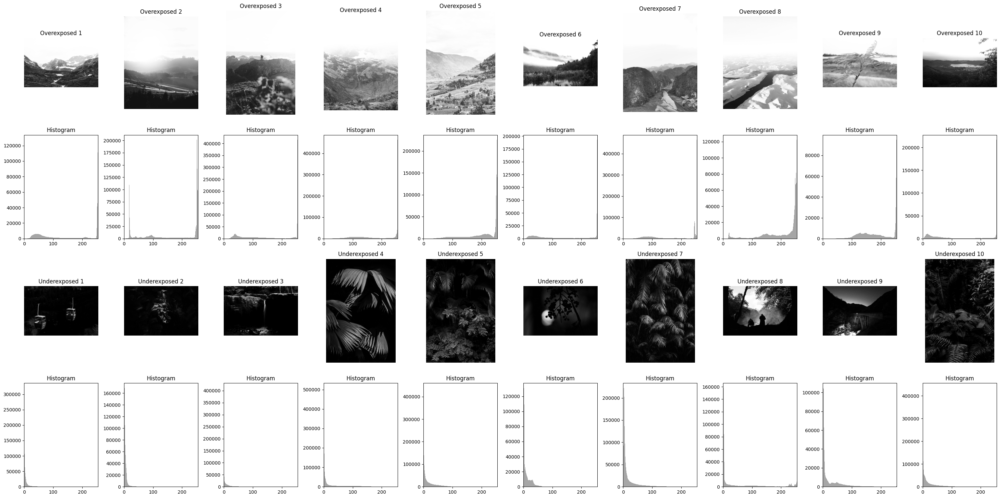

In [ ]:
exposure_stats = []

for image_name in tqdm(flickr_names, desc="Analyzing images for exposure"):
    image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    if image is None:
        continue
    pixels = image.flatten()
    overexposed_score = np.sum(pixels >= 250) / len(pixels) * 100  # % of pixels close to 255
    underexposed_score = np.sum(pixels <= 5) / len(pixels) * 100   # % of pixels close to 0
    exposure_stats.append({
        'Image': image_name,
        'Overexposed Score (%)': overexposed_score,
        'Underexposed Score (%)': underexposed_score
    })

exposure_stats_df = pd.DataFrame(exposure_stats)

# Find the top 10 overexposed and underexposed images
top_overexposed = exposure_stats_df.sort_values(by='Overexposed Score (%)', ascending=False).head(10)
top_underexposed = exposure_stats_df.sort_values(by='Underexposed Score (%)', ascending=False).head(10)
fig, axes = plt.subplots(4, 10, figsize=(30, 15))

# Display overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
        if image is None:
            continue
        pixels = image.flatten()

        # Image plot
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1}")
        axes[0, idx].axis('off')

        # Histogram plot
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram")
        axes[1, idx].set_xlim(0, 255)

# Display underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
        if image is None:
            continue
        pixels = image.flatten()

        # Image plot
        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1}")
        axes[2, idx].axis('off')

        # Histogram plot
        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

Computing exposure metrics: 100%|██████████| 5665/5665 [02:32<00:00, 37.19it/s]


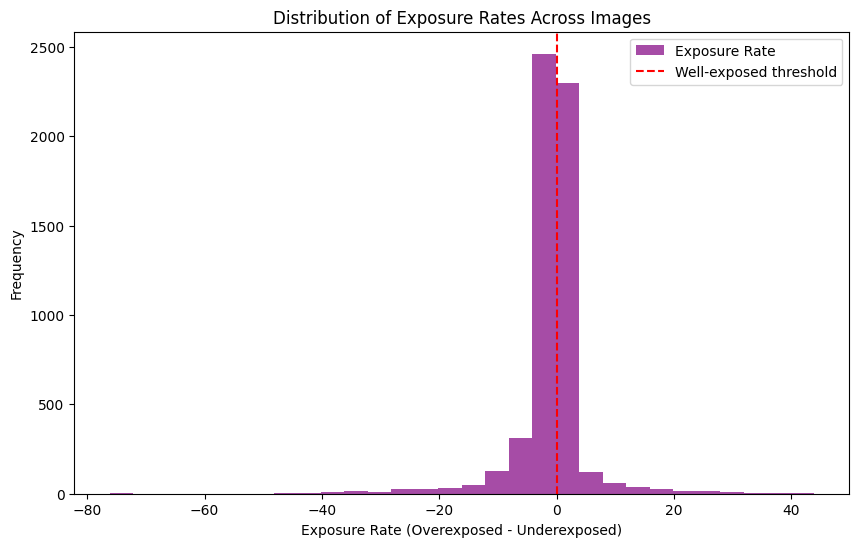

In [ ]:
exposure_metrics = []

for image_name in tqdm(flickr_names, desc="Computing exposure metrics"):
    image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
    if image is None:
        continue
    pixels = image.flatten()
    overexposed_score = np.sum(pixels >= 250) / len(pixels) * 100
    underexposed_score = np.sum(pixels <= 5) / len(pixels) * 100
    exposure_rate = overexposed_score - underexposed_score
    exposure_metrics.append({
        'Image': image_name,
        'Exposure Rate': exposure_rate
    })

exposure_metrics_df = pd.DataFrame(exposure_metrics)
plt.figure(figsize=(10, 6))
plt.hist(
    exposure_metrics_df['Exposure Rate'], bins=30, color='purple', alpha=0.7, label='Exposure Rate'
)
plt.axvline(0, color='red', linestyle='--', label='Well-exposed threshold')
plt.title('Distribution of Exposure Rates Across Images')
plt.xlabel('Exposure Rate (Overexposed - Underexposed)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [ ]:
mean_exposure_rate = exposure_metrics_df['Exposure Rate'].mean()
std_exposure_rate = exposure_metrics_df['Exposure Rate'].std()

# Calculate 2 standard deviations from the mean
threshold_high = mean_exposure_rate + 2 * std_exposure_rate
threshold_low = mean_exposure_rate - 2 * std_exposure_rate

print(f"Exposure Rate 2 standard deviations above the mean: {threshold_high:.2f}")
print(f"Exposure Rate 2 standard deviations below the mean: {threshold_low:.2f}")

Exposure Rate 2 standard deviations above the mean: 11.09
Exposure Rate 2 standard deviations below the mean: -13.15


###  Histogram Equalization

Applying histogram equalization to extreme exposure images: 100%|██████████| 5665/5665 [04:56<00:00, 19.12it/s]


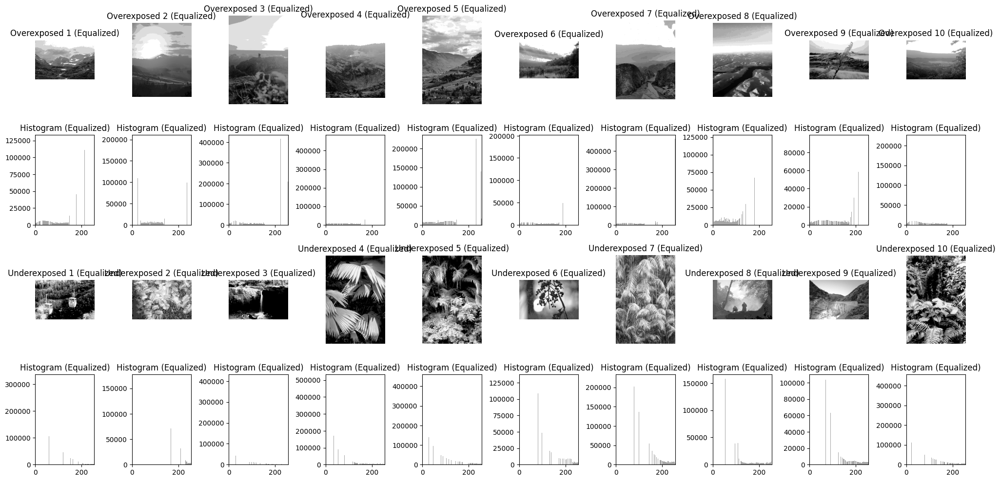

In [ ]:
equalized_images = {}

for idx, row in tqdm(
    exposure_metrics_df.iterrows(),
    desc="Applying histogram equalization to extreme exposure images",
    total=len(exposure_metrics_df)
):
    if row['Exposure Rate'] > threshold_high or row['Exposure Rate'] < threshold_low:
        image_path = row['Image']
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            equalized_image = cv2.equalizeHist(image)
            equalized_images[row['Image']] = equalized_image

fig, axes = plt.subplots(4, 10, figsize=(20, 10))

# Display updated overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after histogram equalization)
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1} (Equalized)")
        axes[0, idx].axis('off')

        # Histogram plot (after histogram equalization)
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram (Equalized)")
        axes[1, idx].set_xlim(0, 255)

# Display updated underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after histogram equalization)
        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1} (Equalized)")
        axes[2, idx].axis('off')

        # Histogram plot (after histogram equalization)
        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram (Equalized)")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

### CLAHE (Contrast Limited Adaptive Histogram Equalization)

Applying CLAHE to extreme exposure images: 100%|██████████| 5665/5665 [04:35<00:00, 20.59it/s]


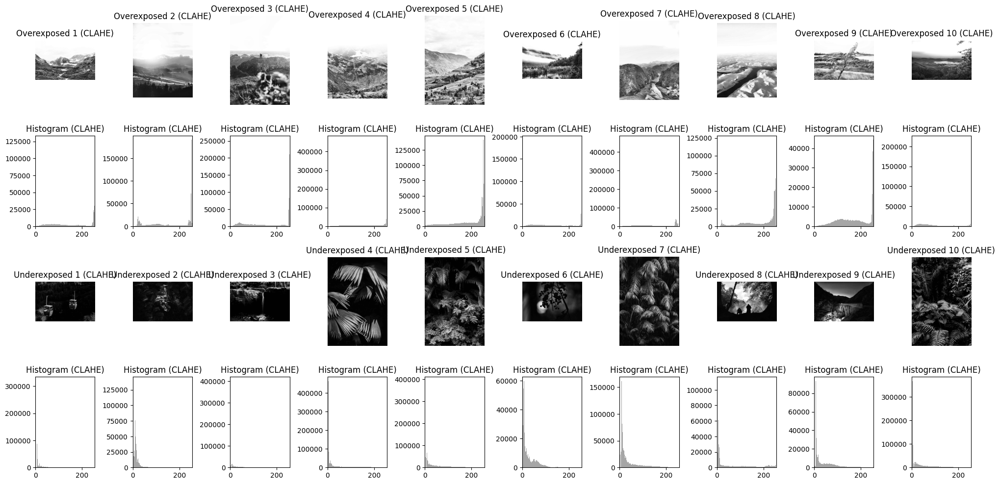

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
equalized_images = {}

for idx, row in tqdm(
    exposure_metrics_df.iterrows(),
    desc="Applying CLAHE to extreme exposure images",
    total=len(exposure_metrics_df)
):
    if row['Exposure Rate'] > threshold_high or row['Exposure Rate'] < threshold_low:
        image_path = row['Image']
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            clahe_image = clahe.apply(image)
            equalized_images[row['Image']] = clahe_image

fig, axes = plt.subplots(4, 10, figsize=(20, 10))

# Display updated overexposed images and histograms
for idx in range(10):
    if idx < len(top_overexposed):
        image_name = top_overexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        # Image plot (after CLAHE)
        axes[0, idx].imshow(image, cmap='gray')
        axes[0, idx].set_title(f"Overexposed {idx+1} (CLAHE)")
        axes[0, idx].axis('off')

        # Histogram plot (after CLAHE)
        axes[1, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[1, idx].set_title("Histogram (CLAHE)")
        axes[1, idx].set_xlim(0, 255)

# Display updated underexposed images and histograms
for idx in range(10):
    if idx < len(top_underexposed):
        image_name = top_underexposed.iloc[idx]['Image']
        image = equalized_images.get(image_name, cv2.imread(image_name, cv2.IMREAD_GRAYSCALE))
        pixels = image.flatten()

        axes[2, idx].imshow(image, cmap='gray')
        axes[2, idx].set_title(f"Underexposed {idx+1} (CLAHE)")
        axes[2, idx].axis('off')

        axes[3, idx].hist(pixels, bins=256, range=(0, 255), color='gray', alpha=0.7)
        axes[3, idx].set_title("Histogram (CLAHE)")
        axes[3, idx].set_xlim(0, 255)

plt.tight_layout()
plt.show()

### Dropping images

In [ ]:
# Count images with exposure rates less than -40%
count_less_than_minus_40 = len(exposure_metrics_df[exposure_metrics_df['Exposure Rate'] < -40])

# Count images with exposure rates greater than +40%
count_greater_than_plus_40 = len(exposure_metrics_df[exposure_metrics_df['Exposure Rate'] > 40])

print(f"Number of images with exposure rate less than -40%: {count_less_than_minus_40}")
print(f"Number of images with exposure rate greater than +40%: {count_greater_than_plus_40}")

In [ ]:
# Remove all images with exposure rate less than -40% or greater than +40%
filtered_exposure_metrics_df = exposure_metrics_df[
    (exposure_metrics_df['Exposure Rate'] >= -40) &
    (exposure_metrics_df['Exposure Rate'] <= 40)
]
print(f"Number of images remaining after filtering: {len(filtered_exposure_metrics_df)}")

In [ ]:
sorted_exposure_df = filtered_exposure_metrics_df.sort_values(by='Exposure Rate', ascending=True)
last_20_lowest_exposure = sorted_exposure_df.head(20)
fig, axes = plt.subplots(4, 5, figsize=(30, 15))

for idx in range(20):
    if idx < len(last_20_lowest_exposure):
        image_name = last_20_lowest_exposure.iloc[idx]['Image']
        exposure_rate = last_20_lowest_exposure.iloc[idx]['Exposure Rate']
        image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)
        if image is None:
            continue
        pixels = image.flatten()

        row = idx // 5
        col = idx % 5
        axes[row, col].imshow(image, cmap='gray')
        axes[row, col].set_title(f"Image {idx+1}\nExposure Rate: {exposure_rate:.2f}%")
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()